### Imports

In [28]:
from influxdb_client import InfluxDBClient
import pandas as pd
import numpy as np
from influxdb_client import InfluxDBClient, Point, Dialect
from influxdb_client.client.write_api import SYNCHRONOUS

### Defining the parameters

In [29]:
INFLUXDB_URL = "http://127.0.0.1:8086"
INFLUXDB_TOKEN = "h4ABAleq01agLd3K5kCI6v5mL74Utcg4Bna8UmMiQ7Y0fnyAwQuYJMQGdczQN2m1xfSizaoFmdghdfPMta1zA"
INFLUXDB_ORG = "kitenergy"
INFLUXDB_BUCKET = "gs"
TIME_OUT = 600000

### Create folders and subfolders for storing the data
- 2025_Jan_Simeri_Crichi”:

        Subfolder “All_campaign_raw_data”
        Subfolder “Main_flights_data”
        Flight log
        README

- All_campaign_raw_data”:

        Subfolder: 2025_01_21_Raw_data
        Subfolder: 2025_01_24_Raw_data
        Subfolder: 2025_01_27_Raw_data
        README
- In each subfolder:

        Meteo_station_raw_data.csv
        Taranis_ raw_data.csv
        PLC_ raw_data.csv
        IPOK_raw_data.csv



In [1]:
# You can run this for creating the some of the empty directories which we need

! mkdir -p 2025_May_Simeri_Crichi/All_campaign_raw_data/2025_05_27_Raw_data
! mkdir -p 2025_May_Simeri_Crichi/All_campaign_raw_data/2025_05_28_Raw_data
! mkdir -p 2025_May_Simeri_Crichi/All_campaign_raw_data/2025_05_29_Raw_data
! mkdir -p 2025_May_Simeri_Crichi/Main_flights_data
! touch 2025_May_Simeri_Crichi/All_campaign_raw_data/README
! touch 2025_May_Simeri_Crichi/README


## The explanation

### First I need to extract the data for one flight and check with Andrea if it's correct and then we can do it for all flights and add the other part from the log

#### The data that we need to extract for each flight:
- AVG and Max of BackL (it should be divided by 2) 
- AVG and Max of BackR (it should be divided by 2)
- AVG and Max of Front 
- Max of 5th line(it should be divided by squared root of 2)
- AVG and Max of BackL + BackR + Front

The naming and variable name mapping: DSLoadCells.MeasureFloat[N]
1: Back L
2: Front
3: 5th Line
4: Back R


------------
- Max MotorRSpeed(also same for L), it should be calculated 1 / 60 * 5 * 4 * This value for the motorSpeedR
-----------
Final value of the point we need from each flight, so first calculate for all the point and extract the final point
- DsExternal.DS_INPUT.RollFS --> A
- DsExternal.DS_PARAMETER_STATUS.Rollstroke --> B
Value = 2 * B * 4 * (A/100)
-----------
- AVG and Max of (MotorLAct * MotorLVoltAct) + (MotorRAct * MotorRVoltAct)
--------------
Then for the following value I need to sum the value of each variables, it means for each flight I should add all the data point together and the final value should be * 4 because of the seeting of the line
- Sum of the difference of pair consecutive values MotorLPosAct * 4 --> I should take the absolute to make sure they don't cancel each other
- Sum of MotorRPosAct * 4
------------

The final thing would be histogram for each flight with Raw value of Forces and Wind speed
- wind speed
- Tot
- Front
- Back L
- Back R




HERE IS THE CORRECT RAW DATA

### Changing in the loadcells order for the test of May back right :1, 5th is 2, front is 3, and back left is 4



### The Forces names and Mapping
- MeasureFloat1: LEFT BACK
- MeasureFloat2: FRONT
- MeasureFloat13: 5th
- MeasureFloat4: RIGHT BACK

### To calculate the raw fiels for Each flight

In [3]:
from influxdb_client import InfluxDBClient
import pandas as pd
import numpy as np
import os

# OUR connection details
INFLUXDB_URL = "http://127.0.0.1:8086"
INFLUXDB_TOKEN = "h4ABAleq01agLd3K5kCI6v5mL74Utcg4Bna8UmMiQ7Y0fnyAwQuYJMQGdczQN2m1xfSizaoFmdghdfPMta1zA"
INFLUXDB_ORG = "kitenergy"
INFLUXDB_BUCKET = "gs"

# TODO: Naming based on the types of the kite could be RRD, new9mq:SLI, 3mq:"CAB"
# time_ranges = [

#     ("2025-05-27T12:01:49Z", "2025-05-21T12:07:08Z", "RRD", "07mq","0kg"),
#     ("2025-05-27T12:52:02Z", "2025-05-21T12:53:39Z", "RRD", "12mq","0kg"), #ASk Andrea
#     ("2025-05-27T14:13:22Z", "2025-05-21T14:19:41Z", "RRD", "12mq","0kg"),
#     ("2025-05-27T14:44:00Z", "2025-05-21T14:50:00Z", "RRD", "12mq","6kg", "15m"),
#     ("2025-01-21T10:52:02Z", "2025-01-21T10:58:00Z", "RRD", "07", ""),
#     ("2025-01-21T11:30:14Z", "2025-01-21T11:31:16Z", "RRD", "07"), #check the seconds od all flights
#     ("2025-01-21T11:40:00Z", "2025-01-21T11:45:30Z", "RRD", "10.5" ),
#     ("2025-01-21T11:55:57Z", "2025-01-21T11:57:59Z", "RRD", "10.5"),
#     ("2025-01-21T12:14:00Z", "2025-01-21T12:16:39Z", "RRD", "12",), 
#     ("2025-01-21T12:17:00Z", "2025-01-21T12:20:39Z", "RRD", "12"),
#     ("2025-01-21T12:23:00Z", "2025-01-21T12:29:39Z", "RRD", "12"),
#     ("2025-01-21T13:38:05Z", "2025-01-21T13:47:20Z", "RRD", "12"),
#     ("2025-01-21T13:52:00Z", "2025-01-21T14:07:04Z", "RRD", "12"), #END of the first day
#     ("2025-01-24T09:01:30Z", "2025-01-24T09:09:09Z", "RRD", "07"),
#     ("2025-01-24T09:16:30Z", "2025-01-24T09:20:09Z", "RRD", "17"),
#     ("2025-01-24T09:25:30Z", "2025-01-24T09:27:09Z", "RRD", "17"), # This is from the second day second flight
#     ("2025-01-24T12:13:30Z", "2025-01-24T12:19:09Z", "RRD", "07"),
#     ("2025-01-24T12:31:00Z", "2025-01-24T12:31:59Z", "RRD", "12"), # This is the end of the second day check the crush seconds
#     ("2025-01-27T10:43:30Z", "2025-01-27T10:44:30Z", "CAB", "03"), # This day has been log in UTC time from pilot
#     ("2025-01-27T11:10:30Z", "2025-01-27T11:11:42Z", "RRD", "09"), 
#     ("2025-01-27T13:07:30Z", "2025-01-27T13:12:13Z", "SLI", "09"), 
#     ("2025-01-27T13:19:30Z", "2025-01-27T13:20:45Z", "SLI", "09"),
#     ("2025-01-27T13:21:20Z", "2025-01-27T13:22:25Z", "SLI", "09"),
#     ("2025-01-27T13:23:30Z", "2025-01-27T13:24:15Z", "SLI", "09"),
#     ("2025-01-27T14:31:23Z", "2025-01-27T14:32:17Z", "RRD", "09"),
#     ("2025-01-27T14:42:43Z", "2025-01-27T14:43:22Z", "RRD", "09"),
#     ("2025-01-27T14:53:00Z", "2025-01-27T14:55:59Z", "RRD", "09"),
#     ("2025-01-27T15:16:00Z", "2025-01-27T15:18:59Z", "RRD", "09"),
# ]

In [ ]:
# time_ranges = [
#     ("2025-05-27T12:01:49Z", "2025-05-21T12:07:08Z", "RRD", "07mq", "00kg", "00m"),
#     ("2025-05-27T12:52:02Z", "2025-05-21T12:53:39Z", "RRD", "12mq", "0kg", "00m"), # ASk Andrea
#     ("2025-05-27T14:13:22Z", "2025-05-21T14:19:41Z", "RRD", "12mq", "0kg","00m"),
#     ("2025-05-27T14:44:00Z", "2025-05-21T14:50:00Z", "RRD", "12mq", "6kg", "15m"),

#     ("2025-05-27T15:22:16Z", "2025-05-21T15:27:51Z", "RRD", "12mq", "6kg", "15m"),
#     ("2025-05-27T15:35:09Z", "2025-05-21T15:36:58Z", "RRD", "12mq", "12kg", "15m"),
#     ("2025-05-27T15:41:06Z", "2025-05-21T15:41:44Z", "RRD", "12mq", "12kg", "15m"),
#     ("2025-05-27T15:43:35Z", "2025-05-21T15:44:15Z", "RRD", "12mq", "12kg", "15m"),

#     ("2025-05-27T15:51:27Z", "2025-05-21T15:51:35Z", "RRD", "12mq", "20kg", "15m"),
#     ("2025-05-27T15:56:05Z", "2025-05-21T15:56:20Z", "RRD", "12mq", "20kg", "15m"),
#     ("2025-05-27T16:03:24Z", "2025-05-21T16:04:03Z", "RRD", "12mq", "20kg", "15m"),

#     ("2025-05-28T14:38:33Z", "2025-05-22T14:39:20Z", "RRD", "17mq", "6kg", "15m"),
#     ("2025-05-28T14:57:02Z", "2025-05-22T15:00:33Z", "RRD", "17mq", "6kg", "15m"),
#     ("2025-05-28T15:13:10Z", "2025-05-22T15:13:32Z", "RRD", "17mq", "20kg", "15m"),
#     ("2025-05-28T15:29:24Z", "2025-05-22T15:30:03Z", "RRD", "17mq", "20kg", "15m"),
#     ("2025-05-28T16:00:25Z", "2025-05-22T16:00:59Z", "RRD", "12mq", "20kg", "15m"),
#     ("2025-05-28T16:27:33Z", "2025-05-22T16:27:50Z", "RRD", "12mq", "20kg", "15m"),

#     ("2025-05-29T07:35:08Z", "2025-05-23T07:35:40Z", "RRD", "12mq", "12kg", "15m"),
#     ("2025-05-29T07:36:40Z", "2025-05-23T07:36:55Z", "RRD", "12mq", "12kg", "15m"),
#     ("2025-05-29T07:39:54Z", "2025-05-23T08:41:42Z", "RRD", "12mq", "12kg", "15m"),
#     ("2025-05-29T08:04:38Z", "2025-05-23T08:16:32Z", "RRD", "12mq", "12kg", "35m"),

#     ("2025-05-29T08:48:38Z", "2025-05-23T09:01:03Z", "RRD", "12mq", "15kg", "35m"),
#     ("2025-05-29T09:26:16Z", "2025-05-23T09:28:42Z", "RRD", "12mq", "18kg", "35m"),
#     ("2025-05-29T09:46:23Z", "2025-05-23T09:47:50Z", "RRD", "12mq", "18kg", "35m"),
#     ("2025-05-29T10:02:46Z", "2025-05-23T10:03:18Z", "RRD", "12mq", "20kg", "35m"), # ExplodedLE
#     ("2025-05-29T11:08:20Z", "2025-05-23T11:09:28Z", "RRD", "12mq", "20kg", "35m"),
#     ("2025-05-29T11:11:10Z", "2025-05-23T11:13:27Z", "RRD", "12mq", "20kg", "35m"),
#     ("2025-05-29T11:14:35Z", "2025-05-23T11:16:33Z", "RRD", "12mq", "20kg", "35m"),
#     ("2025-05-29T11:18:29Z", "2025-05-23T11:19:43Z", "RRD", "12mq", "20kg", "35m"), # 1Loop
# ]


In [ ]:
time_ranges = [
    ("2025-05-27T11:01:49Z", "2025-05-27T11:07:08Z", "RRD", "07mq", "00kg", "00m"),
    ("2025-05-27T11:52:02Z", "2025-05-27T11:53:39Z", "RRD", "12mq", "00kg", "00m"),  # Ask Andrea
    ("2025-05-27T13:13:22Z", "2025-05-27T13:19:41Z", "RRD", "12mq", "00kg", "00m"),
    ("2025-05-27T13:44:00Z", "2025-05-27T13:50:00Z", "RRD", "12mq", "06kg", "15m"),

    ("2025-05-27T14:22:16Z", "2025-05-27T14:27:51Z", "RRD", "12mq", "06kg", "15m"),
    ("2025-05-27T14:35:09Z", "2025-05-27T14:36:58Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-27T14:41:06Z", "2025-05-27T14:41:44Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-27T14:43:35Z", "2025-05-27T14:44:15Z", "RRD", "12mq", "12kg", "15m"),

    ("2025-05-27T14:51:27Z", "2025-05-27T14:51:35Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-27T14:56:05Z", "2025-05-27T14:56:20Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-27T15:03:24Z", "2025-05-27T15:04:03Z", "RRD", "12mq", "20kg", "15m"),

    ("2025-05-28T12:38:33Z", "2025-05-28T12:39:20Z", "RRD", "17mq", "06kg", "15m"),
    ("2025-05-28T12:57:02Z", "2025-05-28T13:00:33Z", "RRD", "17mq", "06kg", "15m"),
    ("2025-05-28T13:13:10Z", "2025-05-28T13:13:32Z", "RRD", "17mq", "20kg", "15m"),
    ("2025-05-28T13:29:24Z", "2025-05-28T13:30:03Z", "RRD", "17mq", "20kg", "15m"),
    ("2025-05-28T14:00:25Z", "2025-05-28T14:00:59Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-28T14:27:33Z", "2025-05-28T14:27:50Z", "RRD", "12mq", "20kg", "15m"),

    ("2025-05-29T05:35:08Z", "2025-05-29T05:35:40Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T05:36:40Z", "2025-05-29T05:36:55Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T05:39:54Z", "2025-05-29T06:41:42Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T06:04:38Z", "2025-05-29T07:16:32Z", "RRD", "12mq", "12kg", "35m"),

    ("2025-05-29T06:48:38Z", "2025-05-29T07:01:03Z", "RRD", "12mq", "15kg", "35m"),
    ("2025-05-29T07:26:16Z", "2025-05-29T07:28:42Z", "RRD", "12mq", "18kg", "35m"),
    ("2025-05-29T07:46:23Z", "2025-05-29T07:47:50Z", "RRD", "12mq", "18kg", "35m"),
    ("2025-05-29T08:02:46Z", "2025-05-29T08:03:18Z", "RRD", "12mq", "20kg", "35m"),  # ExplodedLE
    ("2025-05-29T09:08:20Z", "2025-05-29T09:09:28Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:11:10Z", "2025-05-29T09:13:27Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:14:35Z", "2025-05-29T09:16:33Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:18:29Z", "2025-05-29T09:19:43Z", "RRD", "12mq", "20kg", "35m"),  # 1Loop
]


In [31]:
time_ranges = [
    ("2025-05-27T10:01:49Z", "2025-05-27T10:07:08Z", "RRD", "07mq", "00kg", "00m"),
    ("2025-05-27T10:52:02Z", "2025-05-27T10:53:39Z", "RRD", "12mq", "00kg", "00m"),  # Ask Andrea
    ("2025-05-27T12:13:22Z", "2025-05-27T12:19:41Z", "RRD", "12mq", "00kg", "00m"),
    ("2025-05-27T12:44:00Z", "2025-05-27T12:50:00Z", "RRD", "12mq", "06kg", "15m"),

    ("2025-05-27T13:22:16Z", "2025-05-27T13:27:51Z", "RRD", "12mq", "06kg", "15m"),
    ("2025-05-27T13:35:09Z", "2025-05-27T13:36:58Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-27T13:41:06Z", "2025-05-27T13:41:44Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-27T13:43:35Z", "2025-05-27T13:44:15Z", "RRD", "12mq", "12kg", "15m"),

    ("2025-05-27T13:51:27Z", "2025-05-27T13:51:35Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-27T13:56:05Z", "2025-05-27T13:56:20Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-27T14:03:24Z", "2025-05-27T14:04:03Z", "RRD", "12mq", "20kg", "15m"),

    ("2025-05-28T12:38:33Z", "2025-05-28T12:39:20Z", "RRD", "17mq", "06kg", "15m"),
    ("2025-05-28T12:57:02Z", "2025-05-28T13:00:33Z", "RRD", "17mq", "06kg", "15m"),
    ("2025-05-28T13:13:10Z", "2025-05-28T13:13:32Z", "RRD", "17mq", "20kg", "15m"),
    ("2025-05-28T13:29:24Z", "2025-05-28T13:30:03Z", "RRD", "17mq", "20kg", "15m"),
    ("2025-05-28T14:00:25Z", "2025-05-28T14:00:59Z", "RRD", "12mq", "20kg", "15m"),
    ("2025-05-28T14:27:33Z", "2025-05-28T14:27:50Z", "RRD", "12mq", "20kg", "15m"),

    ("2025-05-29T05:35:08Z", "2025-05-29T05:35:40Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T05:36:40Z", "2025-05-29T05:36:55Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T05:39:54Z", "2025-05-29T05:41:42Z", "RRD", "12mq", "12kg", "15m"),
    ("2025-05-29T06:04:38Z", "2025-05-29T06:16:32Z", "RRD", "12mq", "12kg", "35m"),

    ("2025-05-29T06:48:38Z", "2025-05-29T07:01:03Z", "RRD", "12mq", "15kg", "35m"),
    ("2025-05-29T07:26:16Z", "2025-05-29T07:28:42Z", "RRD", "12mq", "18kg", "35m"),
    ("2025-05-29T07:46:23Z", "2025-05-29T07:47:50Z", "RRD", "12mq", "18kg", "35m"),
    ("2025-05-29T08:02:46Z", "2025-05-29T08:03:18Z", "RRD", "12mq", "20kg", "35m"),  # ExplodedLE
    ("2025-05-29T09:08:20Z", "2025-05-29T09:09:28Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:11:10Z", "2025-05-29T09:13:27Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:14:35Z", "2025-05-29T09:16:33Z", "RRD", "12mq", "20kg", "35m"),
    ("2025-05-29T09:18:29Z", "2025-05-29T09:19:43Z", "RRD", "12mq", "20kg", "35m"),  # 1Loop
]


#### This code is to extract the all raw data for each flights based on the time ranges

In [ ]:
def create_flight_log(start_time, end_time, folder_name, local_path):
    client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)
    # print(start_time, end_time, folder_name, local_path)
    query_api = client.query_api()

    #CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
    # start_time = "2025-01-27T09:00:25Z"
    # end_time = "2025-01-27T17:00:00Z"
    measurment = ["OPC", "METEO", "TANARIS"] # for now the value could be OPC, METEO, TANARIS, "TANARIS"
    for item in measurment:
        
        df_fields = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start:{start_time} , stop:{end_time} ) 
                                                |> filter(fn: (r) => r._measurement == "{item}")
                                                |> keep(columns: ["_field"])
                                                |> distinct()
                                                ''')
        print(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start:{start_time} , stop:{end_time} ) 
                                                |> filter(fn: (r) => r._measurement == "{item}")
                                                |> keep(columns: ["_field"])
                                                |> distinct()
                                                ''')                                  

        df_fields.drop(columns=["result", "table"], inplace=True)

        df_fields.to_csv(f"Fields_name_{measurment}.csv", index=False) #TODO directly read from here


        # READ the fields name from the latest query then add the time and pivot the whole file
        # df_fields = pd.read_csv("Fields_name_opc.csv")
        field_names = df_fields["_field"].dropna().tolist()
        columns_to_keep = ["_time"] + field_names
        keep_cols_str = ','.join(f'"{col}"' for col in columns_to_keep)

        df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start: {start_time}, stop: {end_time}) 
                                                |> filter(fn: (r) => r._measurement == "{item}") 
                                                |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                                |> keep(columns: [{keep_cols_str}])
                                                ''')
                                            
        # if df_all_data.empty():        
        df_all_data.drop(columns=["result", "table"], inplace=True)

        df_all_data.to_csv(f"{local_path}/{folder_name}/{item}_raw_data.csv", index=False)

        client.close()




# Create the folder name for each flights, first extract the names,and stuff
local_path ="2025_May_Simeri_Crichi/Main_flights_data/"
for start, end, lable, sq, weight, distance in time_ranges:
    DD = start.split("-")[2][:2]
    hh = start.split("-")[2][3:5]
    mm = start.split("-")[2][6:8]
    ss =  start.split("-")[2][9:11]
    # sq = sq.replace(".", "p")
    folder_name = f"2025_05_{DD}_{hh}_{mm}_{ss}_{sq}_{lable}_{weight}_{distance}"
    print(folder_name)
    os.makedirs(f"{local_path}{folder_name}", exist_ok=True)
    create_flight_log(start, end, folder_name, local_path)


#### This code is to extract JUST the processed part of the data

In [32]:
def create_flight_log(start_time, end_time, folder_name, local_path):
    client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)
    # print(start_time, end_time, folder_name, local_path)
    query_api = client.query_api()

    #CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
    # start_time = "2025-01-27T09:00:25Z"
    # end_time = "2025-01-27T17:00:00Z"
    measurment = "OPC"# for now the value could be OPC, METEO, TANARIS
    
        
    columns_to_keep = '["_time", "DsLoadCells.MeasureFloat[1]","DsLoadCells.MeasureFloat[2]","DsLoadCells.MeasureFloat[3]","DsLoadCells.MeasureFloat[4]"]'
        # print(columns_to_keep)

    query = f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start: {start_time}, stop: {end_time}) 
                                                |> filter(fn: (r) => r._measurement == "{measurment}") 
                                                |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                                |> keep(columns: {columns_to_keep})
                                                '''

        # print(query)
    df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start: {start_time}, stop: {end_time}) 
                                                |> filter(fn: (r) => r._measurement == "{measurment}") 
                                                |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                                |> keep(columns: {columns_to_keep})
                                                ''')
                                            


                                            

    df_all_data.drop(columns=["result", "table"], inplace=True)
        
        
            # Apply Transformations
   
    # df_all_data["DsLoadCells.MeasureFloat[1]"] = df_all_data["DsLoadCells.MeasureFloat[1]"] / 2
    # df_all_data["DsLoadCells.MeasureFloat[4]"] = df_all_data["DsLoadCells.MeasureFloat[4]"] / 2
    # df_all_data["DsLoadCells.MeasureFloat[3]"] = df_all_data["DsLoadCells.MeasureFloat[3]"] / np.sqrt(2)

    df_all_data["DsLoadCells.MeasureFloat[1]"] = df_all_data["DsLoadCells.MeasureFloat[1]"] / 2
    df_all_data["DsLoadCells.MeasureFloat[4]"] = df_all_data["DsLoadCells.MeasureFloat[4]"] / 2
    df_all_data["DsLoadCells.MeasureFloat[2]"] = df_all_data["DsLoadCells.MeasureFloat[2]"] / np.sqrt(2)

    # back right :1, 5th is 2, front is 3, and back left is 4
    # df_all_data.rename(columns={"DsLoadCells.MeasureFloat[1]":"force_back_left", "DsLoadCells.MeasureFloat[2]": "force_front", "DsLoadCells.MeasureFloat[3]":"force_5th_line", "DsLoadCells.MeasureFloat[4]":"force_back_right"}, inplace=True)
    df_all_data.rename(columns={"DsLoadCells.MeasureFloat[4]":"force_back_left", "DsLoadCells.MeasureFloat[3]": "force_front", "DsLoadCells.MeasureFloat[2]":"force_5th_line", "DsLoadCells.MeasureFloat[1]":"force_back_right"}, inplace=True)

    df_all_data.to_csv(f"{local_path}/{folder_name}/PLC_processed_data.csv", index=False)

    client.close()




# Create the folder name for each flights, first extract the names,and stuff
local_path ="2025_May_Simeri_Crichi/Main_flights_data/"
for start, end, lable, sq, weight, distance in time_ranges:
    DD = start.split("-")[2][:2]
    hh = start.split("-")[2][3:5]
    mm = start.split("-")[2][6:8]
    ss =  start.split("-")[2][9:11]
    # sq = sq.replace(".", "p")
    folder_name = f"2025_05_{DD}_{hh}_{mm}_{ss}_{sq}_{lable}_{weight}_{distance}"
    print(folder_name)
    # os.makedirs(f"{local_path}{folder_name}", exist_ok=True)
    create_flight_log(start, end, folder_name, local_path)





2025_05_27_10_01_49_07mq_RRD_00kg_00m
2025_05_27_10_52_02_12mq_RRD_00kg_00m
2025_05_27_12_13_22_12mq_RRD_00kg_00m
2025_05_27_12_44_00_12mq_RRD_06kg_15m
2025_05_27_13_22_16_12mq_RRD_06kg_15m
2025_05_27_13_35_09_12mq_RRD_12kg_15m
2025_05_27_13_41_06_12mq_RRD_12kg_15m
2025_05_27_13_43_35_12mq_RRD_12kg_15m
2025_05_27_13_51_27_12mq_RRD_20kg_15m
2025_05_27_13_56_05_12mq_RRD_20kg_15m
2025_05_27_14_03_24_12mq_RRD_20kg_15m
2025_05_28_12_38_33_17mq_RRD_06kg_15m
2025_05_28_12_57_02_17mq_RRD_06kg_15m
2025_05_28_13_13_10_17mq_RRD_20kg_15m
2025_05_28_13_29_24_17mq_RRD_20kg_15m
2025_05_28_14_00_25_12mq_RRD_20kg_15m
2025_05_28_14_27_33_12mq_RRD_20kg_15m
2025_05_29_05_35_08_12mq_RRD_12kg_15m
2025_05_29_05_36_40_12mq_RRD_12kg_15m
2025_05_29_05_39_54_12mq_RRD_12kg_15m
2025_05_29_06_04_38_12mq_RRD_12kg_35m
2025_05_29_06_48_38_12mq_RRD_15kg_35m
2025_05_29_07_26_16_12mq_RRD_18kg_35m
2025_05_29_07_46_23_12mq_RRD_18kg_35m
2025_05_29_08_02_46_12mq_RRD_20kg_35m
2025_05_29_09_08_20_12mq_RRD_20kg_35m
2025_05_29_0

In [10]:
# os.makedirs("2025_Jan_Simeri_Crichi/Main_flights_data/2025_01_27_16_15_00")

In [11]:
def create_flight_log(start_time, end_time, folder_name, local_path):
    client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)

    query_api = client.query_api()

    #CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
    # start_time = "2025-01-27T09:00:25Z"
    # end_time = "2025-01-27T17:00:00Z"
    measurment = ["OPC", "METEO", "TANARIS"] # for now the value could be OPC, METEO, TANARIS
    for item in measurment:

        df_fields = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start:{start_time} , stop:{end_time} ) 
                                                |> filter(fn: (r) => r._measurement == "{measurment}")
                                                |> keep(columns: ["_field"])
                                                |> distinct()
                                                ''')
                                            

        df_fields.drop(columns=["result", "table"], inplace=True)

        df_fields.to_csv(f"Fields_name_{measurment}.csv", index=False) #TODO directly read from here


        # READ the fields name from the latest query then add the time and pivot the whole file
        # df_fields = pd.read_csv("Fields_name_opc.csv")
        field_names = df_fields["_field"].dropna().tolist()
        columns_to_keep = ["_time"] + field_names
        keep_cols_str = ','.join(f'"{col}"' for col in columns_to_keep)

        df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                                |> range(start: {start_time}, stop: {end_time}) 
                                                |> filter(fn: (r) => r._measurement == "{measurment}") 
                                                |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                                |> keep(columns: [{keep_cols_str}])
                                                ''')
                                            

        df_all_data.drop(columns=["result", "table"], inplace=True)

        df_all_data.to_csv(f"2025_Jan_Simeri_Crichi/All_campaign_raw_data/2025_01_27_Raw_data/{measurment}_raw_data.csv", index=False)

        client.close()

### 1 EXTRACT and TRABSFORM and SAVE the raw data

In [ ]:
from influxdb_client import InfluxDBClient
import pandas as pd
import numpy as np

# OUR connection details
INFLUXDB_URL = "http://127.0.0.1:8086"
INFLUXDB_TOKEN = "h4ABAleq01agLd3K5kCI6v5mL74Utcg4Bna8UmMiQ7Y0fnyAwQuYJMQGdczQN2m1xfSizaoFmdghdfPMta1zA"
INFLUXDB_ORG = "kitenergy"
INFLUXDB_BUCKET = "gs"

# TODO: Naming based on the types of the kite could be RRD, new9mq:SLI, 3mq:"CAB"
time_ranges = [

    ("2025-01-21T10:38:37Z", "2025-01-21T10:48:39Z", "RRD", "07"),
    ("2025-01-21T10:52:00Z", "2025-01-21T10:58:00Z", "RRD", "07"),
    ("2025-01-21T11:30:14Z", "2025-01-21T11:31:16Z", "RRD", "07"), #check the seconds od all flights
    ("2025-01-21T11:40:00Z", "2025-01-21T11:45:30Z", "RRD", "10.5" ),
    ("2025-01-21T11:55:57Z", "2025-01-21T11:57:59Z", "RRD", "10.5"),
    ("2025-01-21T12:14:00Z", "2025-01-21T12:16:39Z", "RRD", "12",), 
    ("2025-01-21T12:17:00Z", "2025-01-21T12:20:39Z", "RRD", "12"),
    ("2025-01-21T12:23:00Z", "2025-01-21T12:29:39Z", "RRD", "12"),
    ("2025-01-21T13:38:05Z", "2025-01-21T13:47:20Z", "RRD", "12"),
    ("2025-01-21T13:52:00Z", "2025-01-21T14:07:04Z", "RRD", "12"), #END of the first day
    ("2025-01-24T09:01:30Z", "2025-01-24T09:09:09Z", "RRD", "07"),
    ("2025-01-24T09:16:30Z", "2025-01-24T09:20:09Z", "RRD", "17"),
    ("2025-01-24T09:25:30Z", "2025-01-24T09:27:09Z", "RRD", "17"), # This is from the second day second flight
    ("2025-01-24T12:13:30Z", "2025-01-24T12:19:09Z", "RRD", "07"),
    ("2025-01-24T12:31:00Z", "2025-01-24T12:31:59Z", "RRD", "12"), # This is the end of the second day check the crush seconds
    ("2025-01-27T10:43:30Z", "2025-01-27T10:45:09Z", "CAB", "03"), # This day has been log in UTC time from pilot
    ("2025-01-27T11:09:30Z", "2025-01-27T11:11:09Z", "RRD", "09"), 
    ("2025-01-27T13:07:30Z", "2025-01-27T13:12:09Z", "SLI", "09"), 
    ("2025-01-27T13:19:30Z", "2025-01-27T13:20:09Z", "SLI", "09"),
    ("2025-01-27T13:21:00Z", "2025-01-27T13:21:59Z", "SLI", "09"),
    ("2025-01-27T13:24:00Z", "2025-01-27T13:24:59Z", "SLI", "09"),
    ("2025-01-27T14:31:00Z", "2025-01-27T14:31:59Z", "RRD", "09"),
    ("2025-01-27T14:42:00Z", "2025-01-27T14:42:59Z", "RRD", "09"),
    ("2025-01-27T14:53:00Z", "2025-01-27T14:55:59Z", "RRD", "09"),
    ("2025-01-27T15:15:00Z", "2025-01-27T15:17:59Z", "RRD", "09"),
]

client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG)
query_api = client.query_api()


def process_time_range(start_time, end_time, label):
    query = f'''
    from(bucket: "{INFLUXDB_BUCKET}")
        |> range(start: {start_time}, stop: {end_time})
        |> filter(fn: (r) => r._measurement == "OPC" or r._measurement == "METEO")
        |> filter(fn: (r) => r._field == "DsLoadCells.MeasureFloat[1]" or
                        r._field == "DsLoadCells.MeasureFloat[2]" or
                        r._field == "DsLoadCells.MeasureFloat[4]" or
                        r._field == "DsLoadCells.MeasureFloat[3]" or
                        r._field == "DsExternalData.DS_PARAMETER_STATUS.MaxMotorVelocity" or
                        r._field == "DsExternalData.DS_INPUT.MotVelocityReq" or
                        r._field == "DsExternalData.DS_PARAMETER_STATUS.RollStroke" or
                        r._field == "DsExternalData.DS_INPUT.RollFS" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLCurrAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLVoltAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRCurrAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRVoltAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLPosAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRPosAct" or
                        r._field == "meteo.speed"
                        ) 
    '''
    

    tables = query_api.query(query)
    
    data = []
    for table in tables:
        for record in table.records:
            data.append({
                "time": record.get_time(),
                "field": record.get_field(),
                "value": record.get_value()
            })
    
    if not data:
        print(f"No data for {label}")
        return

    df = pd.DataFrame(data)

    # Apply Transformations
    def apply_transformation(row):
        if row["field"] == "DsLoadCells.MeasureFloat[1]":
            return row["value"] / 2
        elif row["field"] == "DsLoadCells.MeasureFloat[4]":
            return row["value"] / 2
        elif row["field"] == "DsLoadCells.MeasureFloat[3]":
            return row["value"] / np.sqrt(2)
        elif row["field"] == "DsExternalData.DS_OUTPUT.MotorLCurrAct":
            if row["value"] < 0:
                return abs(row["value"])
            else:
                return 0
            
        elif row["field"] == "DsExternalData.DS_OUTPUT.MotorRCurrAct":
            if row["value"] < 0:
                return abs(row["value"])
            else:
                return 0
        else:
            return row["value"]
    
    df["processed_value"] = df.apply(apply_transformation, axis=1)

    agg_df = df.groupby("field").agg(
        max_value=("processed_value", "max"),
        avg_value=("processed_value", "mean")
    ).reset_index()



    # Compute Total Absolute Difference for MotorLPosAct
    # totMotorAct = f"totalMotorPos_{label}"
    totMotorAct ={
    }

    for motor_field in ["DsExternalData.DS_OUTPUT.MotorLPosAct", "DsExternalData.DS_OUTPUT.MotorRPosAct"]:
        motor_df = df[df["field"] == motor_field].copy()
        if not motor_df.empty:
            motor_df = motor_df.sort_values(by="time")
            motor_df["abs_diff"] = motor_df["processed_value"].diff().abs()
            total_abs_diff = motor_df["abs_diff"].sum()
            # print(f"Total Absolute Difference for {motor_field} ({label}): {total_abs_diff}")
            totMotorAct[motor_field] = total_abs_diff
            
            #motor_df.to_csv(f"motor_diff_{motor_field.replace('.', '_')}_{label}.csv", index=False) #TODO I don't need this I should add thr total
    # print(totMotorAct)       
    df_Motor_Pos =pd.DataFrame(totMotorAct, index=[0,1])
    df_Motor_Pos.to_csv(f"sumMotor_Pos_{label}.csv", index=False)

    df.to_csv(f"raw_data_{label}.csv", index=False)
    agg_df.to_csv(f"aggregated_data_{label}.csv", index=False)


    # print(f"Processed data for {label}")
    # print(agg_df.head())

# HERE is the main loop for the filghts
for start, end, label in time_ranges:
    process_time_range(start, end, label)

	


### 2 CALCULATE THE METRICS STROKE and ACTUATION 

In [ ]:

#TODO: DON'T FORGET TO CHANGE THIS, extract the lables of flights

labels = ["Flight_05", "Flight_07", "Flight_08", "Flight_02"]


def calulate_met(label):
    
    agg_df = pd.read_csv(f"aggregated_data_{label}.csv")

    # Convert to Dictionary for Easier Lookup
    agg_dict = agg_df.set_index("field")["avg_value"].to_dict()

    # Extract Required Values
    A = agg_dict.get("DsExternalData.DS_INPUT.RollFS", 0)
    B = agg_dict.get("DsExternalData.DS_PARAMETER_STATUS.RollStroke", 0)
    AA = agg_dict.get("DsExternalData.DS_PARAMETER_STATUS.MaxMotorVelocity", 0)
    BB = agg_dict.get("DsExternalData.DS_INPUT.MotVelocityReq", 0)

    
    RollStroke = 2 * B * 4 * A / 100
    ActuationVel = AA * BB / 100 * 1 / 60 * 5 * 4

    results_df = pd.DataFrame({
        "Metric": ["RollStroke", "ActuationVel"],
        "Value": [RollStroke, ActuationVel]
    })

    results_df.to_csv(f"calculated_aggregated_metrics_{label}.csv", index=False)

    # print(results_df)

for label in labels:
    calulate_met(label)



### 3 Calculate the Power Combo

In [ ]:

def pow_combo(label):
    df = pd.read_csv(f"raw_data_{label}.csv")
    df_wide = df.pivot(index="time", columns="field", values="processed_value").reset_index()

    df_wide["productPow"] = (
    df_wide["DsExternalData.DS_OUTPUT.MotorLCurrAct"] * df_wide["DsExternalData.DS_OUTPUT.MotorLVoltAct"] +
    df_wide["DsExternalData.DS_OUTPUT.MotorRCurrAct"] * df_wide["DsExternalData.DS_OUTPUT.MotorRVoltAct"])
    agg_df_pow = df_wide.agg(
    max_value=("productPow", "max"),
    avg_value=("productPow", "mean")).reset_index()
    # print(agg_df_pow)
    agg_df_pow.to_csv(f"combo_pow{label}.csv", index=False)

for label in labels:
    pow_combo(label)

### 4 Pivot the process data and Build the processed CSV data 

In [ ]:

def pivoting_data(label):
    raw_df = pd.read_csv(f"raw_data_{label}.csv")
    # raw_df.drop(axis=0) TODO: ASK Andrea if he need this or not the speed is not align with other data
    pivot_process_df = raw_df.pivot(index="time", columns="field", values="processed_value")
    pivot_process_df.to_csv(f"pivoting_data_{label}.csv")

for label in labels:
    pivoting_data(label)

### 5 Changing the name of some variables and refine for the final version

#TODO: So what I have to do is: in the finall pivoting_data 
- to change the name of the forces, 
-Interpolated the wind data
- change the current names 
- add the wind direction

## How to Query the PIVOT from the influx API

In [ ]:
from influxdb_client import InfluxDBClient, Point, Dialect
from influxdb_client.client.write_api import SYNCHRONOUS

INFLUXDB_URL = "http://127.0.0.1:8086"
INFLUXDB_TOKEN = "h4ABAleq01agLd3K5kCI6v5mL74Utcg4Bna8UmMiQ7Y0fnyAwQuYJMQGdczQN2m1xfSizaoFmdghdfPMta1zA"
INFLUXDB_ORG = "kitenergy"
INFLUXDB_BUCKET = "gs"

client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=600000)


query_api = client.query_api()

start_time = "2025-01-21T10:20:25Z"
end_time = "2025-01-21T10:21:00Z"

"""
Query: using Pandas DataFrame
"""



data_frame = query_api.query_data_frame(f'from(bucket:"gs") '
                                        '|> range(start: 2025-01-21T10:00:25Z, stop: 2025-01-21T17:00:00Z) '
                                        '|> filter(fn: (r) => r._measurement == "TANARIS")'
                                        '|> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value") '
                                        '|> keep(columns: ["_time", "DsLoadCells.MeasureFloat[2]", "DsLoadCells.MeasureFloat[4]", "meteo.speed"])'
                                        )
                                    

data_frame.drop(columns=["result", "table"], inplace=True)
# print(data_frame.to_string())
print(data_frame.columns)
data_frame.to_csv("Fields_name_tanaris.csv", index=False)
"""
Close client
"""
client.close()

#### The problem that I realize using Data Frame query:
- query from different measurements are not align even if they share the same time
- TODO: Discuss this with Antonello and study how we can do it efficiently
- The Data Base Design is efficient for writing and then query and the join is a disaster later why we need to write in different measurements? How we can try to improve it! Maybe we can update it

In [ ]:
339+153/2+144/2

487.5

# EXTRACTING ALL DATA

### This part is on how to reterive the fields names and then save all different measurement data together:
- So first I have quried the fields and saved them,   <span style='background :red' >    for different result YOU NEED TO change the value of parameters </span> 
- Then I read the fields name and query based on the range of time, which is defined by start_time and end_time, change if you need different date and tiem

In [27]:

client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)

query_api = client.query_api()

#CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
start_time = "2025-05-29T05:30:00Z"
end_time = "2025-05-29T16:10:00Z"
measurment = "OPC" # for now the value could be OPC, METEO, TANARIS

df_fields = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start:{start_time} , stop:{end_time} ) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}")
                                        |> keep(columns: ["_field"])
                                        |> distinct()
                                        ''')
                                    

df_fields.drop(columns=["result", "table"], inplace=True)

df_fields.to_csv(f"Fields_name_{measurment}.csv", index=False) #TODO directly read from here


# READ the fields name from the latest query then add the time and pivot the whole file
# df_fields = pd.read_csv("Fields_name_opc.csv")
field_names = df_fields["_field"].dropna().tolist()
columns_to_keep = ["_time"] + field_names
keep_cols_str = ','.join(f'"{col}"' for col in columns_to_keep)

df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start: {start_time}, stop: {end_time}) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}") 
                                        |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                        |> keep(columns: [{keep_cols_str}])
                                        ''')
                                    

df_all_data.drop(columns=["result", "table"], inplace=True)
# df_all_data.drop(columns=["Vel", 'UNKNOWN CODE (3 TYPE (0))'], inplace=True)
print(df_all_data.columns)
print(df_all_data.head())
# df_all_data.to_csv(f"2025_May_Simeri_Crichi/{measurment}_raw_data.csv", index=False)
df_all_data.to_csv(f"2025_May_Simeri_Crichi/All_campaign_raw_data/2025_05_29_Raw_data/{measurment}_raw_data.csv", index=False)

client.close()

/home/nb2/Preprocess/preproc/lib/python3.12/site-packages/influxdb_client/client/warnings.py:31: MissingPivotFunction: The query doesn't contains the pivot() function.

The result will not be shaped to optimal processing by pandas.DataFrame. Use the pivot() function by:

    from(bucket:"gs") 
                                        |> range(start:2025-05-29T05:30:00Z , stop:2025-05-29T16:10:00Z ) 
                                        |> filter(fn: (r) => r._measurement == "OPC")
                                        |> keep(columns: ["_field"])
                                        |> distinct()
                                         |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")

You can disable this warning by:
    import warnings
    from influxdb_client.client.warnings import MissingPivotFunction

    warnings.simplefilter("ignore", MissingPivotFunction)

For more info see:
    - https://docs.influxdata.com/resources/videos/pivots-in-flux/
    - 

Index(['_time', 'DEVICE_STATE.BOARD_TEMPERATURE',
       'DEVICE_STATE.CPU_LOAD_ALL_CORES', 'DEVICE_STATE.CPU_LOAD_PER_CORE[1]',
       'DEVICE_STATE.CPU_LOAD_PER_CORE[2]', 'DEVICE_STATE.reserved1',
       'DEVICE_STATE.reserved2', 'DsAlarms.CONFIRM_RESET',
       'DsAlarms.LIMIT_SWITCH_LEFT', 'DsAlarms.LIMIT_SWITCH_RIGHT',
       ...
       'DsMotors.Warning[1]', 'DsMotors.Warning[2]', 'DsMotors.inHoming',
       'DsMotors.inOperationMode[1]', 'DsMotors.inOperationMode[2]',
       'DsMotors.outOperationMode[1]', 'DsMotors.outOperationMode[2]',
       'last_update_epoch', 'last_update_iso', 'opc.connected'],
      dtype='object', length=150)
                             _time  DEVICE_STATE.BOARD_TEMPERATURE  \
0 2025-05-29 05:30:00.018494+00:00                            43.0   
1 2025-05-29 05:30:00.076732+00:00                            43.0   
2 2025-05-29 05:30:00.133966+00:00                            43.0   
3 2025-05-29 05:30:00.250174+00:00                            43.0   


In [15]:
df_all_data.head()

,_time,PiFSn,PiFSp,PiVel,Piswth,Pitch,Roll,RollFS
0,2025-05-28 08:50:14.061536+00:00,27.0,1211.0,NaN,NaN,357.0,NaN,NaN
1,2025-05-28 08:50:14.115226+00:00,20.0,NaN,NaN,NaN,348.0,NaN,NaN
2,2025-05-28 08:50:14.279529+00:00,19.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2025-05-28 08:50:14.552367+00:00,13.0,NaN,NaN,NaN,345.0,NaN,NaN
4,2025-05-28 08:50:14.608284+00:00,4.0,NaN,NaN,NaN,337.0,NaN,NaN


In [ ]:
30*32

960

### This Part is on how to partially extrac data:

The things you should be careful is checking the parameter and change them as to the desiered value

 <span style='background :red' >  CAREFUL with the columns to keep </span>  You have the fields names for each measurements in csv files, you can just copy past the names


In [ ]:
client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)

query_api = client.query_api()

#CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
start_time = "2025-01-21T12:23:57Z"
end_time = "2025-01-21T12:28:59Z"
measurment = "OPC" # for now the value could be OPC, METEO, TANARIS
columns_to_keep = '["_time", "DsLoadCells.MeasureFloat[1]","DsLoadCells.MeasureFloat[2]","DsLoadCells.MeasureFloat[3]","DsLoadCells.MeasureFloat[4]"]'
# print(columns_to_keep)

query = f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start: {start_time}, stop: {end_time}) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}") 
                                        |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                        |> keep(columns: {columns_to_keep})
                                        '''

# print(query)
df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start: {start_time}, stop: {end_time}) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}") 
                                        |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                        |> keep(columns: {columns_to_keep})
                                        ''')
                                    

df_all_data.drop(columns=["result", "table"], inplace=True)

df_all_data.to_csv(f"partial_testttttdata111111_{measurment}_{start_time}.csv", index=False)

client.close()


### This is for the wind data that we have, the May 2025

In [ ]:

client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG, timeout=TIME_OUT)

query_api = client.query_api()

#CHANGE THESE PARAMETER FOR DIFFERENT RANGE OF TIME, AND FIELDS:
start_time = "2025-05-21T08:00:25Z"
end_time = "2025-05-22T18:00:00Z"
measurment = "METEO" # for now the value could be OPC, METEO, TANARIS

df_fields = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start:{start_time} , stop:{end_time} ) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}")
                                        |> keep(columns: ["_field"])
                                        |> distinct()
                                        ''')
                                    

df_fields.drop(columns=["result", "table"], inplace=True)

df_fields.to_csv(f"Fields_name_{measurment}.csv", index=False) #TODO directly read from here


# READ the fields name from the latest query then add the time and pivot the whole file
# df_fields = pd.read_csv("Fields_name_opc.csv")
field_names = df_fields["_field"].dropna().tolist()
columns_to_keep = ["_time"] + field_names
keep_cols_str = ','.join(f'"{col}"' for col in columns_to_keep)

df_all_data = query_api.query_data_frame(f'''from(bucket:"{INFLUXDB_BUCKET}") 
                                        |> range(start: {start_time}, stop: {end_time}) 
                                        |> filter(fn: (r) => r._measurement == "{measurment}") 
                                        |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
                                        |> keep(columns: [{keep_cols_str}])
                                        ''')
                                    

df_all_data.drop(columns=["result", "table"], inplace=True)

df_all_data.to_csv(f"{start_time}_{measurment}_raw_data.csv", index=False)

client.close()

/home/nb2/Preprocess/preproc/lib/python3.12/site-packages/influxdb_client/client/warnings.py:31: MissingPivotFunction: The query doesn't contains the pivot() function.

The result will not be shaped to optimal processing by pandas.DataFrame. Use the pivot() function by:

    from(bucket:"gs") 
                                        |> range(start:2025-05-21T08:00:25Z , stop:2025-05-22T18:00:00Z ) 
                                        |> filter(fn: (r) => r._measurement == "METEO")
                                        |> keep(columns: ["_field"])
                                        |> distinct()
                                         |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")

You can disable this warning by:
    import warnings
    from influxdb_client.client.warnings import MissingPivotFunction

    warnings.simplefilter("ignore", MissingPivotFunction)

For more info see:
    - https://docs.influxdata.com/resources/videos/pivots-in-flux/
    

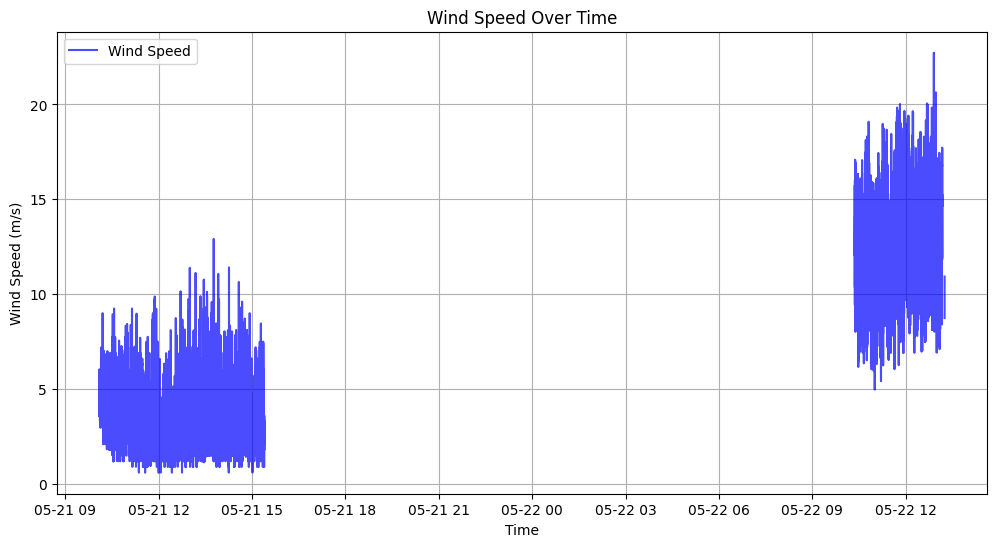

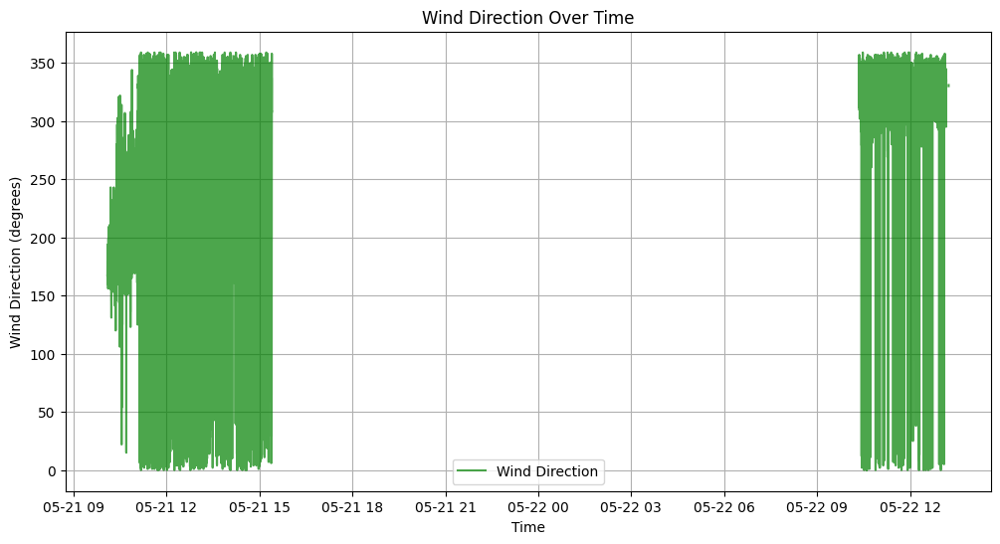

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = "2025-05-21T08:00:25Z_METEO_raw_data.csv"
wind_data = pd.read_csv(file_path)

# Convert the '_time' column to datetime
wind_data['_time'] = pd.to_datetime(wind_data['_time'], errors='coerce')

# Remove timezone information from '_time' column
wind_data['_time'] = wind_data['_time'].dt.tz_localize(None)

# Plot wind speed over time
plt.figure(figsize=(12, 6))
plt.plot(wind_data['_time'], wind_data['meteo.speed'], label='Wind Speed', color='blue', alpha=0.7)
plt.title('Wind Speed Over Time')
plt.xlabel('Time')
plt.ylabel('Wind Speed (m/s)')
plt.legend()
plt.grid()
plt.show()

# Plot wind direction over time
plt.figure(figsize=(12, 6))
plt.plot(wind_data['_time'], wind_data['meteo.direction'], label='Wind Direction', color='green', alpha=0.7)
plt.title('Wind Direction Over Time')
plt.xlabel('Time')
plt.ylabel('Wind Direction (degrees)')
plt.legend()
plt.grid()
plt.show()

In [24]:
!pip install plotly

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# Load the CSV file
file_path = "2025-05-21T08:00:25Z_METEO_raw_data.csv"
wind_data = pd.read_csv(file_path)

# Convert the '_time' column to datetime and remove timezone
wind_data['_time'] = pd.to_datetime(wind_data['_time'], errors='coerce').dt.tz_localize(None)

wind_data = wind_data.dropna(subset=['meteo.direction', 'meteo.speed'])
fig = go.Figure()

# Add wind speed trace
fig.add_trace(go.Scatter(
    x=wind_data['_time'],
    y=wind_data['meteo.speed'],
    mode='lines',
    name='Wind Speed',
    line=dict(color='blue', width=2),
    hovertemplate='Time: %{x}<br>Wind Speed: %{y} m/s<extra></extra>'
))

# Add wind direction trace
fig.add_trace(go.Scatter(
    x=wind_data['_time'],
    y=wind_data['meteo.direction'],
    mode='lines',
    name='Wind Direction',
    line=dict(color='green', width=2),
    hovertemplate='Time: %{x}<br>Wind Direction: %{y}°<extra></extra>'
))

# Customize layout
fig.update_layout(
    title='Wind Speed and Direction Over Time',
    xaxis_title='Time',
    yaxis_title='Value',
    legend_title='Metrics',
    template='plotly_white',
    hovermode='x unified',
    width=1200,
    height=600
)

# Show the interactive graph
fig.show()

In [ ]:
from influxdb_client import InfluxDBClient
import pandas as pd
import numpy as np  # For sqrt

# InfluxDB Connection Details
INFLUXDB_URL = "http://127.0.0.1:8086"
INFLUXDB_TOKEN = "h4ABAleq01agLd3K5kCI6v5mL74Utcg4Bna8UmMiQ7Y0fnyAwQuYJMQGdczQN2m1xfSizaoFmdghdfPMta1zA"
INFLUXDB_ORG = "kitenergy"
INFLUXDB_BUCKET = "gs"

# Define Time Range
START_DATE = "2025-01-21T12:24:00Z"
END_DATE = "2025-01-21T12:28:52Z"

# Connect to InfluxDB
client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG)
query_api = client.query_api()

# Define Flux Query to Extract Data
query = f'''
from(bucket: "{INFLUXDB_BUCKET}")
  |> range(start: {START_DATE}, stop: {END_DATE})
  |> filter(fn: (r) => r._measurement == "OPC")
  |> filter(fn: (r) => r._field == "DsLoadCells.MeasureFloat[1]" or
                        r._field == "DsLoadCells.MeasureFloat[2]" or
                        r._field == "DsLoadCells.MeasureFloat[4]" or
                        r._field == "DsLoadCells.MeasureFloat[3]" or
                        r._field == "DsExternalData.DS_PARAMETER_STATUS.MaxMotorVelocity" or
                        r._field == "DsExternalData.DS_INPUT.MotVelocityReq" or
                        r._field == "DsExternalData.DS_PARAMETER_STATUS.RollStroke" or
                        r._field == "DsExternalData.DS_INPUT.RollFS" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLCurrAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLVoltAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRCurrAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRVoltAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorLPosAct" or
                        r._field == "DsExternalData.DS_OUTPUT.MotorRPosAct"
                        ) 
'''

tables = query_api.query(query)

data = []
for table in tables:
    for record in table.records:
        data.append({
            "time": record.get_time(),
            "field": record.get_field(),
            "value": record.get_value()
        })

df = pd.DataFrame(data)

def apply_transformation(row):
    if row["field"] == "DsLoadCells.MeasureFloat[1]":
        return row["value"] / 2  # Divide by 2
    elif row["field"] == "DsLoadCells.MeasureFloat[4]":
        return row["value"] / 2  # Divide by 2
    elif row["field"] == "DsLoadCells.MeasureFloat[3]":
        return row["value"] / np.sqrt(2)  # Divide by sqrt(2)
    else:
        return row["value"]  # Keep original value

df["processed_value"] = df.apply(apply_transformation, axis=1)

# Pivot Data to Structured Format
df_pivot = df.pivot(index="time", columns="field", values="processed_value").reset_index() # THIS IS MESSED UP why? the piovt has different reading beacuse of the wind data? NO

# Compute Aggregations
agg_df = df_pivot.set_index("time").agg(["max", "mean"]).T.reset_index()
agg_df.columns = ["field", "max_value", "avg_value"]  # Rename columns

agg_df.to_csv("structured_aggregated_data.csv", index=False)

print("Structured Raw Data:")
print(df_pivot.head())

print("\nStructured Aggregated Data:")
print(agg_df.head())

### Changing the TAG and the source
- The schema hase been changed so here I can use the idea of just the trasform
- Add the time ranges like this
- Investigate the segmentation of the data based on the forces